In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv('Data/Real-Data/Real_Combine.csv')

In [3]:
df.head()


,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,12.8,22.6,4.0,1020.0,75.0,1.3,2.0,9.4,60.436250
1,13.8,23.0,6.5,1020.7,79.0,1.1,0.9,3.5,47.497083
2,13.5,23.4,6.7,1021.3,83.0,0.6,7.2,22.2,48.394583
3,13.2,20.0,7.1,1019.9,88.0,0.8,3.7,9.4,57.945417
4,13.6,20.1,7.0,1017.5,85.0,0.8,6.9,14.8,60.902500


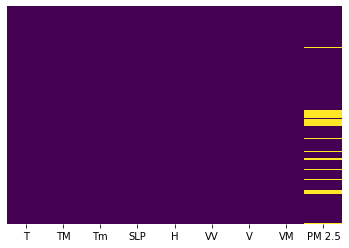

In [4]:
## Check for null values

sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')
plt.show()

In [5]:
df=df.dropna()

In [6]:
X=df.iloc[:,:-1] ## independent features
y=df.iloc[:,-1] ## dependent features

In [7]:
## check null values
X.isnull()

,T,TM,Tm,SLP,H,VV,V,VM
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
888,False,False,False,False,False,False,False,False
889,False,False,False,False,False,False,False,False
890,False,False,False,False,False,False,False,False
891,False,False,False,False,False,False,False,False


In [8]:
y.isnull()


0      False
1      False
2      False
3      False
4      False
       ...  
888    False
889    False
890    False
891    False
892    False
Name: PM 2.5, Length: 801, dtype: bool

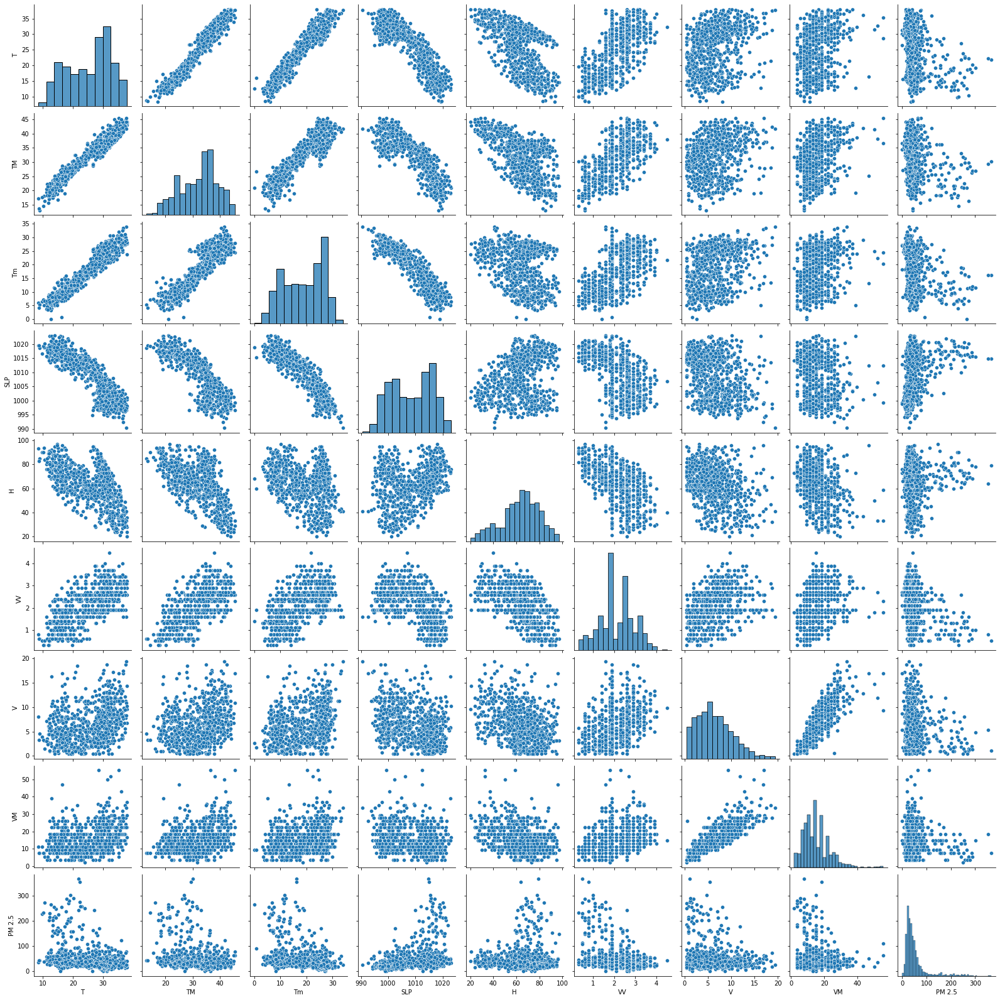

In [9]:
sns.pairplot(df)
plt.show()

In [10]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.965654,0.952481,-0.884520,-0.542981,0.648102,0.306993,0.275843,-0.347176
TM,0.965654,1.000000,0.892373,-0.834988,-0.606840,0.617572,0.283873,0.286975,-0.321148
Tm,0.952481,0.892373,1.000000,-0.914488,-0.321380,0.550158,0.302561,0.241312,-0.351656
SLP,-0.884520,-0.834988,-0.914488,1.000000,0.291176,-0.514929,-0.309846,-0.260956,0.379463
H,-0.542981,-0.606840,-0.321380,0.291176,1.000000,-0.552225,-0.336072,-0.365865,0.108396
VV,0.648102,0.617572,0.550158,-0.514929,-0.552225,1.000000,0.379118,0.333477,-0.355831
V,0.306993,0.283873,0.302561,-0.309846,-0.336072,0.379118,1.000000,0.826139,-0.194147
VM,0.275843,0.286975,0.241312,-0.260956,-0.365865,0.333477,0.826139,1.000000,-0.158485
PM 2.5,-0.347176,-0.321148,-0.351656,0.379463,0.108396,-0.355831,-0.194147,-0.158485,1.000000


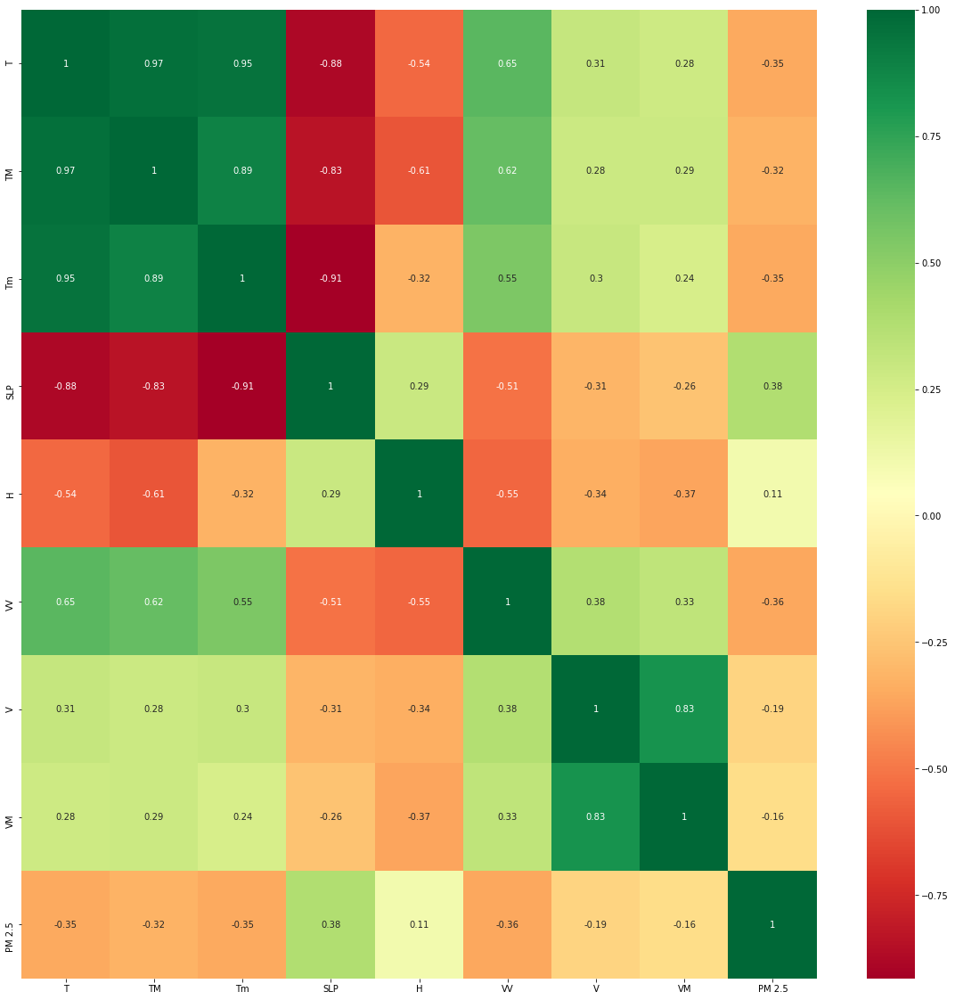

In [11]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")
plt.show()

In [12]:
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

In [13]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()
model.fit(X,y)

ExtraTreesRegressor()

In [14]:
X.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,12.8,22.6,4.0,1020.0,75.0,1.3,2.0,9.4
1,13.8,23.0,6.5,1020.7,79.0,1.1,0.9,3.5
2,13.5,23.4,6.7,1021.3,83.0,0.6,7.2,22.2
3,13.2,20.0,7.1,1019.9,88.0,0.8,3.7,9.4
4,13.6,20.1,7.0,1017.5,85.0,0.8,6.9,14.8


In [15]:
print(model.feature_importances_)

[0.11931293 0.11964295 0.13188779 0.1492071  0.14483617 0.16179041
 0.08643202 0.08689065]


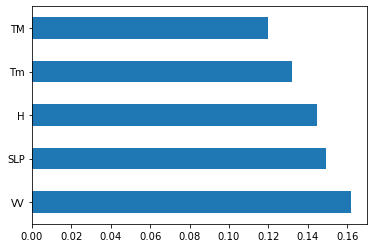

In [16]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()


# Decision Tree Regressor

C:\Users\adars\anaconda3\envs\sk\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


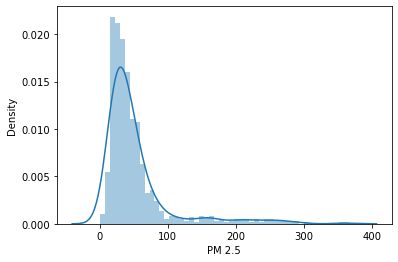

In [17]:
sns.distplot(y)
plt.show()


### Train Test split

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [19]:
from sklearn.tree import DecisionTreeRegressor

In [20]:
dtree=DecisionTreeRegressor(criterion="mse")

In [21]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [22]:
print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [23]:
print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on test set: -0.9200266498710088


In [24]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)

In [25]:
score.mean()

-6.318039713566529

## Tree Visualization
Scikit learn actually has some built-in visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library, but here is an example of what it looks like and the code to execute this:

In [26]:
from IPython.display import Image  
from six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus


In [27]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [28]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [29]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.952474 to fit



#### Model Evaluation

In [30]:
prediction=dtree.predict(X_test)

C:\Users\adars\anaconda3\envs\sk\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


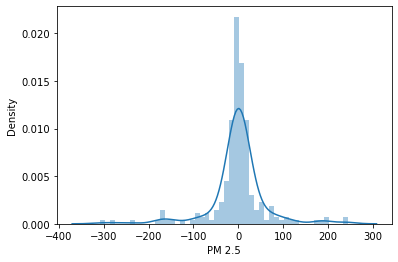

In [31]:
sns.distplot(y_test-prediction)
plt.show()

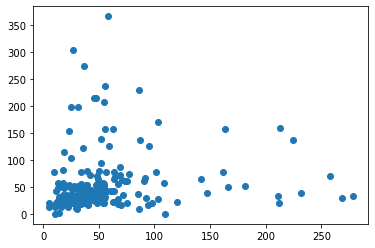

In [32]:
plt.scatter(y_test,prediction)
plt.show()

### Hyperparameter Tuning Decision Tree Regressor

In [33]:

## Hyper Parameter Optimization

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}

In [34]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [35]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)


In [36]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [37]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits

 Time taken: 0 hours 4 minutes and 43.3 seconds.


In [38]:
random_search.best_params_

{'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': 70,
 'min_samples_leaf': 2,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'random'}

In [39]:
random_search.best_score_

-2434.931235687899

In [40]:
predictions=random_search.predict(X_test)

C:\Users\adars\anaconda3\envs\sk\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


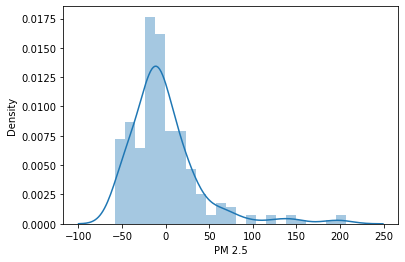

In [41]:
sns.distplot(y_test-predictions)
plt.show()

In [42]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 28.42523318259017
MSE: 1762.2343587161013
RMSE: 41.97897519849789


In [43]:
import pickle

In [44]:
# open a file, where you ant to store the data
file = open('decision_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(random_search, file)